# CEGE0042 | Group project | 
## Traffic forecast

This document contains code and results for traffic speed forecasting. Using a `long short-term memory` (LSTM) algorhithm

**Inputs:**
- Data from R processing script
- External packages (listed below)

**Outputs:**
- Trained model(s)
- Data visualisations
- Model Key Performance Indicators for comparison

**Contributors:** [Chloe Mow](https://github.com/chloemow) | [Hannah Ker](https://github.com/hannahker) | [Fu Yu](https://github.com/Connor666) | [Antonios Fiala](https://github.com/antoniosfiala) ||

## A | Import packages

In [1]:
#=== A.1 | Data processing
import numpy as np
import pandas as pd
import datetime
from datetimerange import DateTimeRange

#=== A.2 | Visualisation
import matplotlib.pyplot as plt
import seaborn as sns

#=== A.3 | Analysis
import tensorflow as tf
from tensorflow import keras
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

#=== A.4 | Others
import math
import os
from timeit import default_timer as timer

Install packages here if you must

In [2]:
#pip install 

## B | Notebook settings

In [3]:
#=== B.1 | formating
# specifies number of rows to show
pd.set_option('display.max_rows', 300)

# specifies default number format to 4 decimal places
pd.options.display.float_format = '{:40,.4f}'.format 

#=== B.2 | random seed settings (for reproducibility)
random_seed = 10
np.random.seed(random_seed)
tf.random.set_seed(random_seed)

## C | Read in data
Data pre-processed in R to extract from assignment-issued data package.

Time is arranged in 5 minute increments between the hours of 6am (1) to 9pm (180) across a date range of 01.01.2011 to 30.01.2011 (inclusive)

Reference for python date time formatting [here](https://www.w3schools.com/python/python_datetime.asp)

In [4]:
# Measuring start time
workflow_timer_start = timer()

In [5]:
#=== C.1 | specify file path (one level above where this file is)
file_location = "../2_data_split/traffic_speeds.csv"

# read in & preview data
loaded_data = pd.read_csv(file_location)
loaded_data.head()

,1745,1747,417,1878,1604,1620,1447,1622,1407,2357,...,2047,2344,433,434,446,447,452,453,Time,Date
0,0.0769,0.0845,0.2062,0.1057,0.1786,0.1268,0.1084,0.0915,0.2150,0.1261,...,0.1637,0.0931,0.1293,0.1420,0.1748,0.1307,0.1183,0.0818,1,2011-01-01
1,0.0847,0.0739,0.1635,0.1015,0.1850,0.1142,0.1125,0.0931,0.1878,0.1550,...,0.1736,0.1030,0.1425,0.1455,0.1879,0.1213,0.0986,0.1244,2,2011-01-01
2,0.0870,0.0786,0.1406,0.1182,0.1716,0.1016,0.1015,0.0946,0.1613,0.1483,...,0.1839,0.1156,0.1232,0.1342,0.1776,0.1411,0.1394,0.1031,3,2011-01-01
3,0.0874,0.0801,0.1765,0.1168,0.1894,0.1245,0.1386,0.0905,0.2072,0.1417,...,0.1938,0.1323,0.1375,0.1472,0.1767,0.1373,0.1028,0.0941,4,2011-01-01
4,0.0874,0.0872,0.1561,0.1307,0.1697,0.1158,0.1153,0.0966,0.2616,0.1343,...,0.1858,0.1103,0.1353,0.1289,0.1683,0.1407,0.1310,0.1087,5,2011-01-01


In [6]:
#=== C.2 | light data processing

# separate time columns
input_data = np.array(loaded_data.iloc[:,:-2])
time_columns = loaded_data.iloc[:,-2:]

In [7]:
#=== C.3 | time label settings
time_range_start = "T06:00:00"
time_range_end = "T20:55:00"

#=== C.4 | add full date time label to time data frame
# empty list to store values
time_labels = []

# Generate time labels series

for date in time_columns.Date.unique():
    
    time_range = DateTimeRange(f"{date}{time_range_start}", f"{date}{time_range_end}")
    for value in time_range.range(datetime.timedelta(minutes = 5)):
        #print(value)
        time_labels.append(value)

# Add new series to df
time_columns["Date_time"] = time_labels

In [8]:
#=== C.5 | presentation format for time series
time_columns["Date_time_show"] = time_columns["Date_time"].dt.strftime("%a (%d-%b) %H:%M")
time_columns.head()

,Time,Date,Date_time,Date_time_show
0,1,2011-01-01,2011-01-01 06:00:00,Sat (01-Jan) 06:00
1,2,2011-01-01,2011-01-01 06:05:00,Sat (01-Jan) 06:05
2,3,2011-01-01,2011-01-01 06:10:00,Sat (01-Jan) 06:10
3,4,2011-01-01,2011-01-01 06:15:00,Sat (01-Jan) 06:15
4,5,2011-01-01,2011-01-01 06:20:00,Sat (01-Jan) 06:20


### C | PLOT 1

Visualise a sample road, e.g. road at index 0 (id: 1745)

In [9]:
# define function
def f_plot_road_time(p_road_link_data):
    """Function docstring:"""
    
    global time_columns
    
    # road to plot
    road_plot_data = p_road_link_data
    road_name = road_plot_data.name
    road_date = time_columns["Date_time"].dt.strftime("%B %d %Y")
    road_plot_title = f"C | Plot | Road link {road_name} between {road_date.min()} and {road_date.max()}"

    # tick setup
    tick_positions = np.arange(0, 5400, 90)
    tick_labels = time_columns.Date_time_show[tick_positions]

    # plt set up
    plt.figure(figsize=(16, 4), dpi=300)
    plt.xticks(ticks = tick_positions,labels = tick_labels,rotation=90)
    plt.grid(color='gray', linestyle='-', linewidth=0.2)
    plt.title(road_plot_title,loc = "left")

    # highlight periods of interest
    weekend_positions = np.arange(0, 5400, 1260)
    for value in weekend_positions:
        plt.axvspan(value,value+360,facecolor='grey', edgecolor='none', alpha=0.15)

    # plt command
    plt.plot(time_columns["Date_time_show"], road_plot_data,linewidth = 0.5)

/Users/antonios/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


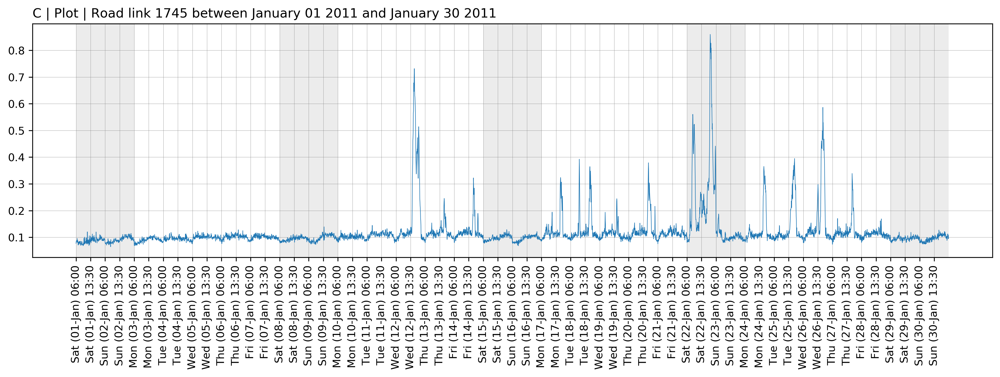

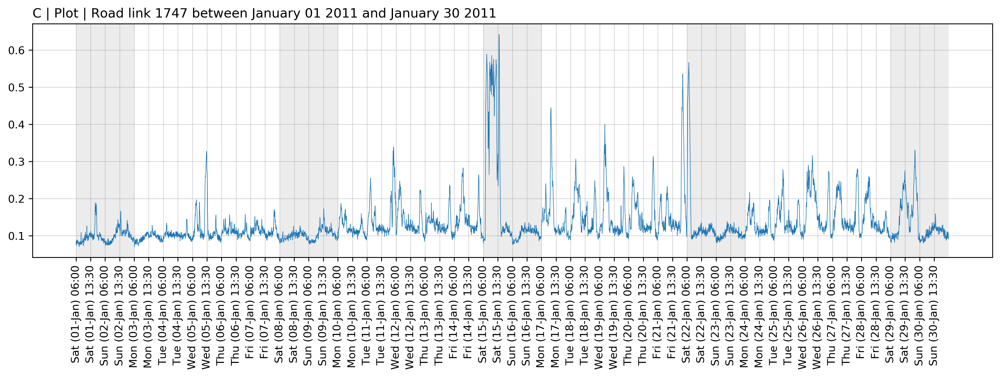

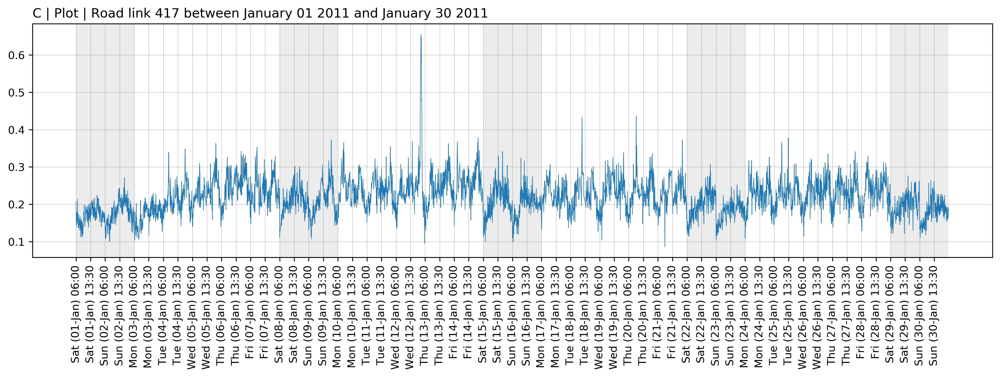

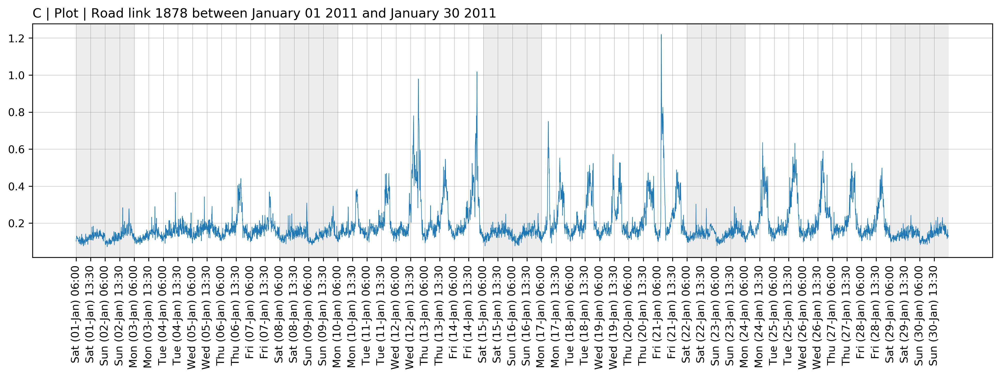

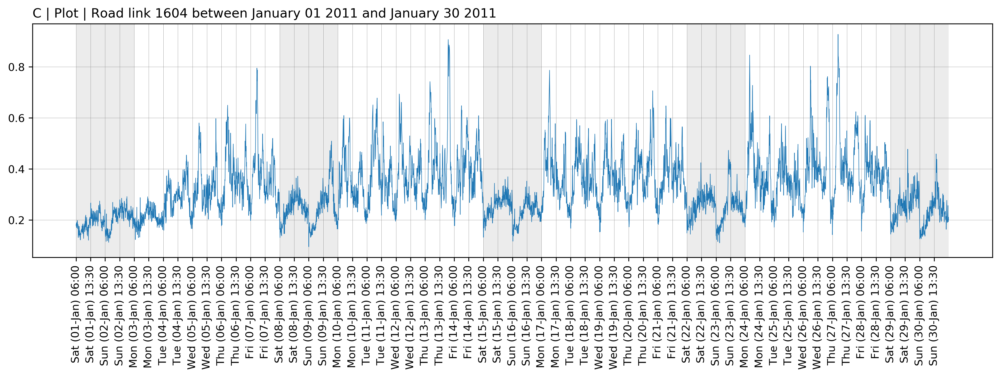

...

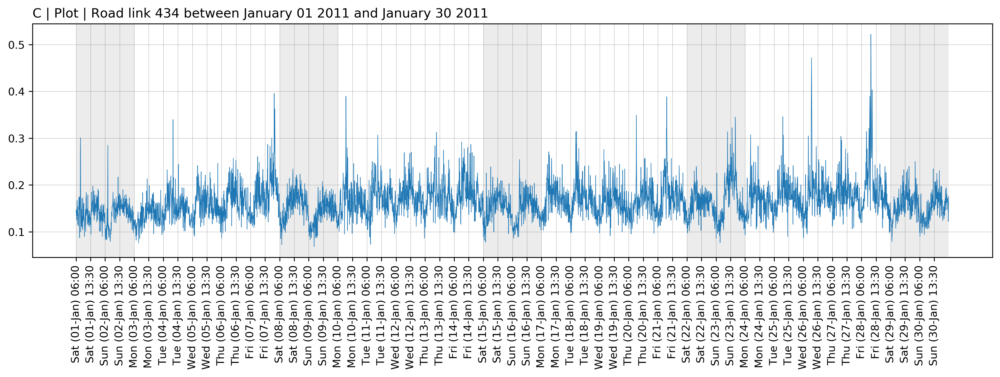

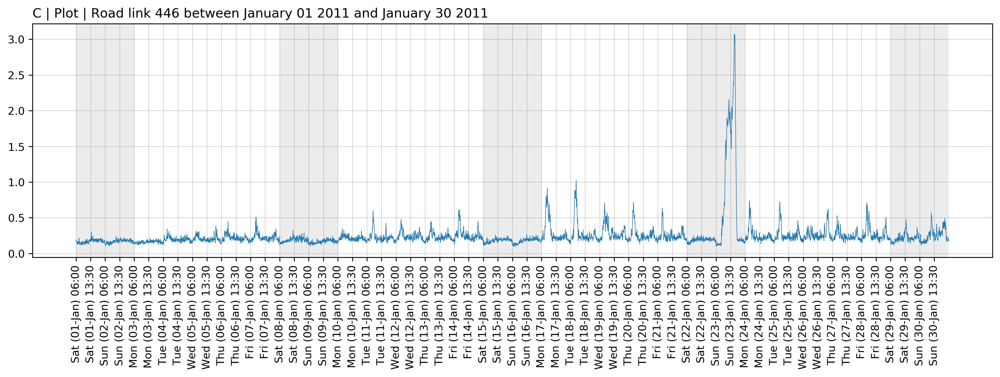

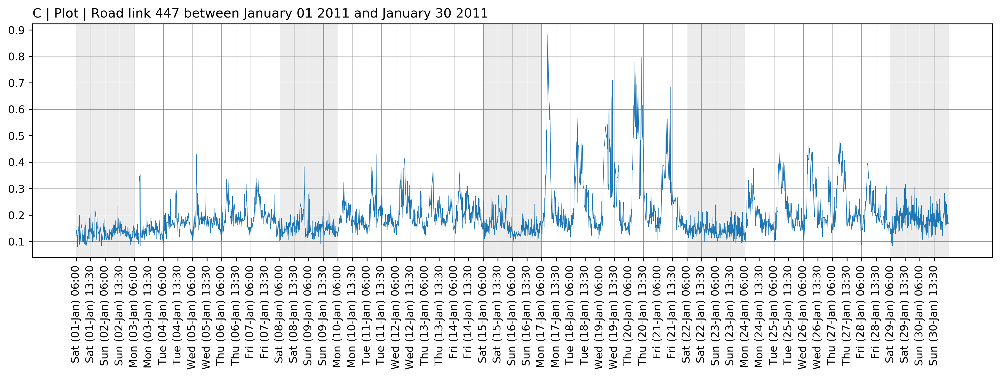

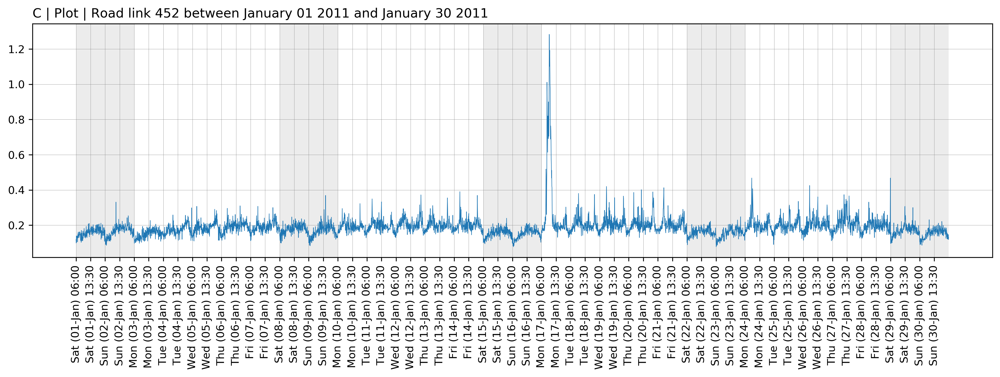

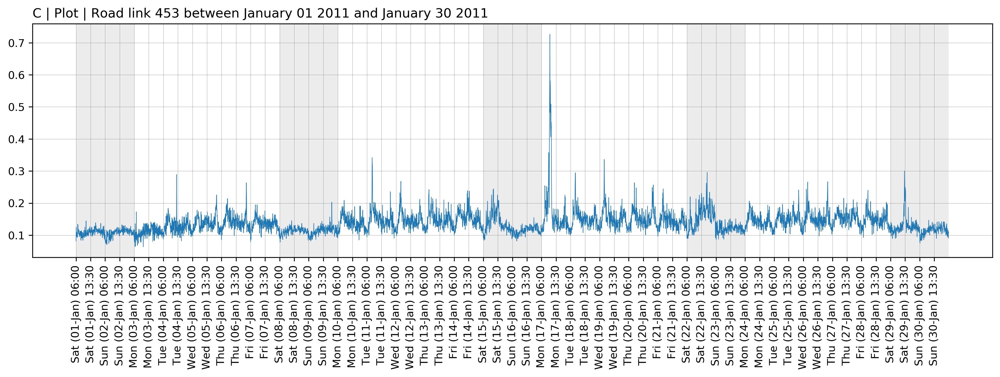

In [10]:
# take index for all road links in dataset
road_links = np.arange(0, loaded_data.shape[1]-2, 1)
# testing only
# road_links = np.arange(0, 3, 1)

# cycle through all road links to generate plot
for road in road_links:
    f_plot_road_time(loaded_data.iloc[:,road])
    
#[IMPROVE] SAVE PNG OUTPUTS

In [11]:
#=== C.6 | create function for dataset

#=== [COME_BACK] TO THIS AND EXPLAIN WHAT IS HAPPENING, especially with TIME_STEPS and with X and Y training data

def create_dataset(data, time_steps):
    Xs, ys = [], []
    for i in range(len(data)-time_steps):
        # Reshape data from (time_steps,) to (time_steps, 1)
        Xs.append(np.reshape(data[i:(i+time_steps)], (time_steps, 1)))
        ys.append(data[i+time_steps])

    return np.array(Xs), np.array(ys)

In [12]:
#=== C.7 | create an X and Y dataset

Xs=[]
ys=[]

for i in range(input_data.shape[1]):
    x, y = create_dataset(input_data[:,i], time_steps=10) # Read in each road data
    Xs.append(x)
    ys.append(y)
    
Xs=np.array(Xs)
ys=np.array(ys)

print('The shape of X is {}, and the shape of y is {}.'.format(Xs.shape, ys.shape))

#=== [COME_BACK] WHAT DO ELEMENTS WITH 10 ENTRIES DO?

The shape of X is (22, 5390, 10, 1), and the shape of y is (22, 5390).


In [13]:
input_data.shape

(5400, 22)

### C | Training, validation, test sets

In [14]:
#=== C.7 | create an X and Y dataset
train_days=23
step=180
X_train, y_train = Xs[:,:train_days*step], ys[:,:train_days*step]
X_test, y_test = Xs[:,train_days*step:], ys[:,train_days*step:]
print('The shape of training X is {}, and the shape of training y is {}.'.format(X_train.shape, y_train.shape))
print('The shape of testing X is {}, and the shape of testing y is {}.'.format(X_test.shape, y_test.shape))

The shape of training X is (22, 4140, 10, 1), and the shape of training y is (22, 4140).
The shape of testing X is (22, 1250, 10, 1), and the shape of testing y is (22, 1250).


In [15]:
#=== C.8 | reshape data to be RF friendly
X_trainRF=X_train.reshape(22,-1,10)
X_testRF=X_test.reshape(22,-1,10)
y_trainRF=y_train

In [16]:
print(X_trainRF.shape)
print(y_trainRF.shape)

(22, 4140, 10)
(22, 4140)


## D | RF model


In [17]:
# List with RF results
result_RF=[]

model_start_timer = timer()

# Loop over all the road links
for i in range (X_trainRF.shape[0]):
    
    # RF parameters [COME_BACK and review these settings]
    clf_RF=RandomForestRegressor(max_depth=5,n_estimators=140,n_jobs=6)
    
    # Fit model
    clf_RF.fit(X_trainRF[i], y_trainRF[i])
    
    # Test model
    y_predRF=clf_RF.predict(X_testRF[i])
    
    # Append results
    result_RF.append(y_predRF)

model_end_timer = timer()   

print(f"Time for training all models is {model_end_timer-model_start_timer}") # Time in seconds, e.g. 5.38091952400282

Time for training all models is 14.745244075000002


In [18]:
result_RF=np.array(result_RF)
print(result_RF.shape)

(22, 1250)


### D | Plot 1

In [35]:
# define function
def f_plot_predicted_road_time(p_road_link_index,p_xlim = (0,5400),p_ylim = (0,0.8), p_tick_every = 90):
    """Function docstring:"""
    
    global time_columns
    global y_train
    global y_test
    global result_RF
        
    # road to plot
    road_index = p_road_link_index
    road_date = time_columns["Date_time"].dt.strftime("%B %d %Y, %H:%M")
    road_plot_title = "Test title"#f"C | Plot | Road link at index {road_index} between {road_date[p_xlim[0]]} and {road_date[p_xlim[1]]}"

    # tick setup
    tick_positions = np.arange(0, 5400, p_tick_every)
    tick_labels = time_columns.Date_time_show[tick_positions]

    # plt set up
    plt.figure(figsize=(16, 4), dpi=300)
    plt.xticks(ticks = tick_positions,labels = tick_labels,rotation=90)
    plt.grid(color='gray', linestyle='-', linewidth=0.2)
    plt.title(road_plot_title,loc = "left")
    line_width = 0.5

    # highlight periods of interest
    weekend_positions = np.arange(0, 5400, 1260)
    for value in weekend_positions:
        plt.axvspan(value,value+360,facecolor='grey', edgecolor='none', alpha=0.15)

    # plt command
    plt.plot(y_train[road_index], label='historical data',linewidth = line_width)
    plt.plot(list(range(len(y_train[road_index]), len(y_train[road_index])+len(y_test[road_index]))), y_test[road_index], label='True values',linewidth = line_width)
    plt.plot(list(range(len(y_train[road_index]), len(y_train[road_index])+len(y_test[road_index]))), result_RF[road_index], label='Predicted values',linewidth = line_width)
    plt.legend()
    
    if p_ylim is None:
        plt.ylim(0,y_test[road_index].max()+0.05)
    else:
        plt.ylim(p_ylim[0],p_ylim[1])
    
    if p_xlim is None:
        pass
    else:
        plt.xlim(p_xlim[0],p_xlim[1])

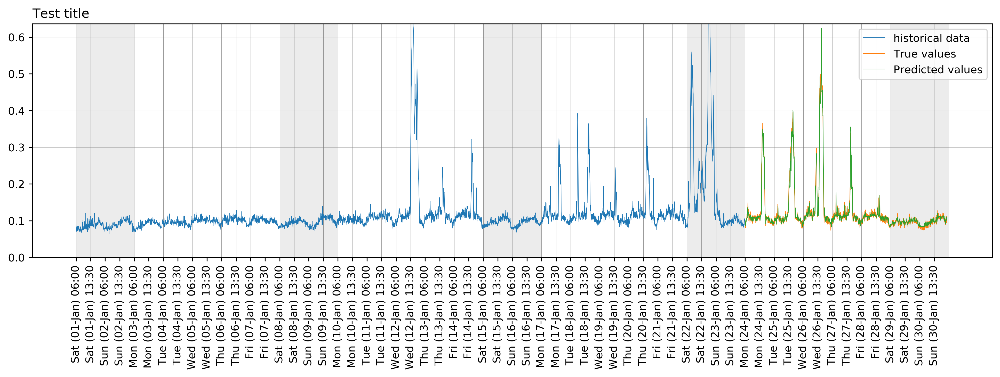

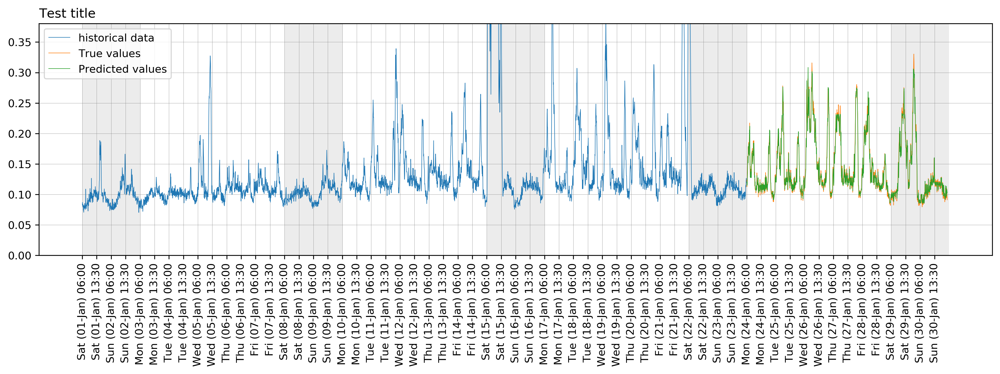

In [38]:
# run function on one road link
for value in list(range(0,2,1)):
    f_plot_predicted_road_time(p_road_link_index = value,
                               p_xlim = None, #(4100,4300),
                               p_ylim = None, #(0,0.8),
                               p_tick_every = 90
                              )

### D | Testing

In [21]:
# [COME_BACK] to refine way of testing RF regression
# Not very correct, need to further research
mse_RF=[]

for i in range (X_trainRF.shape[0]):
    mse_RF.append(mean_squared_error(result_RF[i],y_test[i]))
    
print('RF:',np.mean(mse_RF))

RF: 0.0015616842343893105


### D | Plot 3

Heatmap visualisation

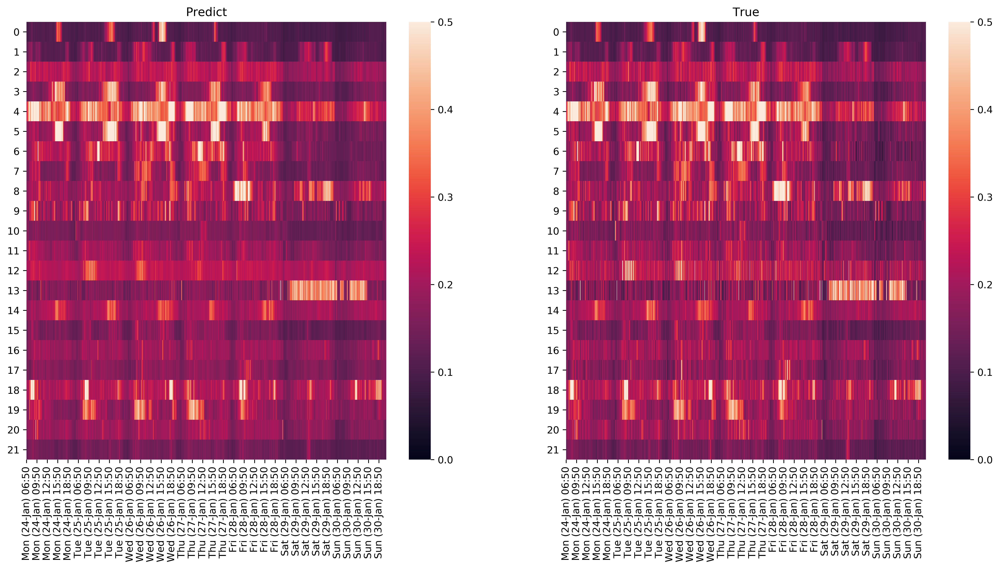

In [22]:
# Preparation of heatmap
heatmap_RF=result_RF.reshape(22,-1)

# Time ticks
tick_frequency = 36 # every 3 hours
tick_positions = np.arange(0, heatmap_RF.shape[1], tick_frequency)
# Take slice of time dataframe based on length of test data in heatmap_LSTM, 
# reset the index and then sample the required tick positions
tick_labels = time_columns.Date_time_show[-heatmap_RF.shape[1]:].reset_index(drop=True)[tick_positions]

# Plot heatmap
fig = plt.figure(figsize=(18, 18), dpi = 450)
ax1=plt.subplot(2,2,1)
ax2=plt.subplot(2,2,2)

plt.sca(ax1)
plt.title('Predict')
sns_plot_pre = sns.heatmap(heatmap_RF,vmin=0,vmax=0.5)
plt.xticks(ticks = tick_positions, labels = tick_labels,rotation=90)
plt.yticks(rotation=0)
plt.ylim(22,0)

plt.sca(ax2)
plt.title('True')
sns_plot_test = sns.heatmap(y_test,vmin=0,vmax=0.5)
plt.xticks(ticks = tick_positions, labels = tick_labels,rotation=90)
plt.yticks(rotation=0)
plt.ylim(22,0)

plt.show()


## E | Workflow reporting

In [23]:
# Measuring end time
workflow_timer_end = timer()

In [24]:
# Report run time
workflow_time = (workflow_timer_end - workflow_timer_start)
print(f"Workflow took {workflow_time/60} minutes to run.")

Workflow took 1.6091671583999998 minutes to run.
